# Advanced Lane Finding Project
Aim of the project is to more accurately detect the lanes on road images, and then on a video stream. 

## Pipeline of this project:
1) Compute the camera caliberation matrix and distortion coefficients from the supplied chessboard images.
2) Apply distortion correction to the raw road images.
3) Implement color and gradient thresholds to create a binary threshold image.
4) Apply perspective transform to binary threshold image to get top view (birds eye view).
5) Detect the lane pixels and fit to find lane boundary.
6) Determine lane curvature and vehicle position wrt centre.
7) Warp the detected boundaries back to the original image.

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import os
import pickle
from os.path import isfile, join
from ipywidgets import interact, interactive, fixed

%matplotlib inline
#%matplotlib qt

#'/path/to/folder'
Calibration_inputpath= 'C:/Users/lovesa/Desktop/Self_Driving_Engineer_Course/Project-2-Advanced_Line_Finding/Project2Submission/camera_cal'
Calibration_outputpath = 'C:/Users/lovesa/Desktop/Self_Driving_Engineer_Course/Project-2-Advanced_Line_Finding/Project2Submission/output_images'

In [2]:
"""
test_imgs = os.listdir(Calibration_inputpath)

testfolder = [ f for f in os.listdir(Calibration_inputpath) if isfile(join(Calibration_inputpath,f)) ]
#images = np.empty(len(testfolder), dtype=object)
#figsize=(10, 25)
print(len(testfolder))

for n in range(0, len(testfolder)):
    image = cv2.imread( join(Calibration_inputpath,testfolder[n]) )
    
    filename = 'Orig_'+ str(test_imgs[n])
    fig = plt.figure()
    plt.title(filename)
    plt.imshow(image)
"""

"\ntest_imgs = os.listdir(Calibration_inputpath)\n\ntestfolder = [ f for f in os.listdir(Calibration_inputpath) if isfile(join(Calibration_inputpath,f)) ]\n#images = np.empty(len(testfolder), dtype=object)\n#figsize=(10, 25)\nprint(len(testfolder))\n\nfor n in range(0, len(testfolder)):\n    image = cv2.imread( join(Calibration_inputpath,testfolder[n]) )\n    \n    filename = 'Orig_'+ str(test_imgs[n])\n    fig = plt.figure()\n    plt.title(filename)\n    plt.imshow(image)\n"

## Camera Calibration
The camera calibration is computed once, and applied to distort the frame of the road images.
Chessboard size is set to 9x6 for the project.
Assume the camera is mounted at the center of the car.
It is reccommended to use at least 20 images of different angles for calibration.

You need to set your chessboard size to 9x6 for the project instead of 8x6 as in the lesson

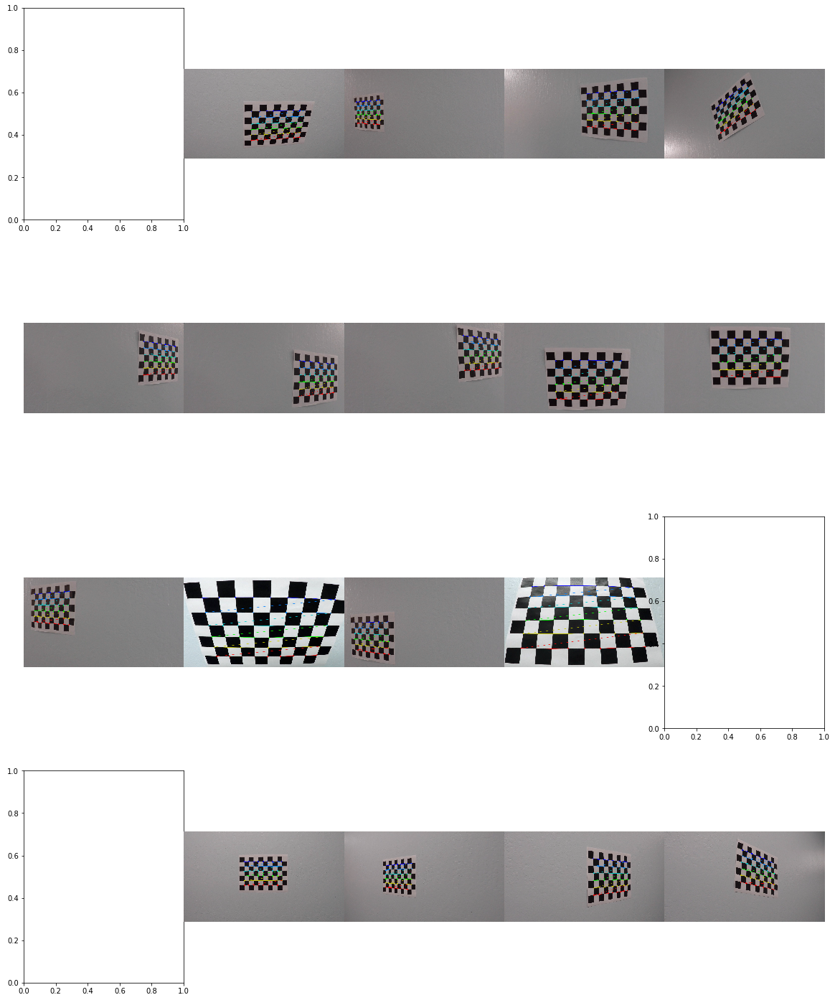

In [3]:
#Each chessboard has 9,6 points to check
nx = 9 #number of inside corners in x
ny = 6 #number of inside corners in y

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
#images = glob.glob('C:/Users/lovesa/Desktop/Self_Driving_Engineer_Course/Project-2-Advanced_Line_Finding/Project2Submission/camera_cal/calibration*.jpg')
images = glob.glob('./camera_cal/calibration*.jpg')

fig, axs = plt.subplots(4,5, figsize=(20, 25))
fig.subplots_adjust(hspace = .2, wspace=.001)
axs = axs.ravel()

# Step through the list and search for chessboard corners

for i, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        #fig = plt.figure()
        #plt.title('Orig_', fontsize=10)
        axs[i].axis('off')
        axs[i].imshow(img)
        
        #saving corners overlay image on original
        #f.savefig("C:/Users/lovesa/Desktop/Self_Driving_Engineer_Course/Project-2-Advanced_Line_Finding/Project2Submission/output_images")        

The function identified the internal corners of the chestboard. 
Note that some of the Chessboard images only had nx = 9, ny = 5 shown in the frame, so they weren't included 

## Undistorting the images
One example is shown below with how distortion effects the chessboard image

In [4]:
# function for undistorting calibration images
# performs the camera calibration, image distortion correction and 
# returns the undistorted image

def undistort(img, objpoints, imgpoints):
    
    #img_size = (img.shape[1], img.shape[0])

    # use cv2.calibrateCamera() to calculate the data necessary for undistorting an image
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[1:], None, None)
    
    # undistort image
    undist = cv2.undistort(img, mtx, dist, None, mtx)

    return undist

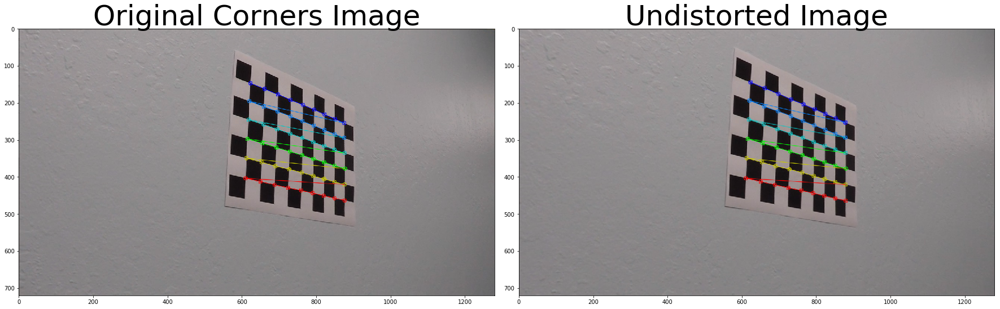

In [5]:
#img = cv2.imread('C:/Users/lovesa/Desktop/Self_Driving_Engineer_Course/Project-2-Advanced_Line_Finding/Project2Submission/camera_cal/calibration1.jpg')

undistorted = undistort(img, objpoints, imgpoints)

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Corners Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

Below are the road test images in their undistorted form compared to their original.
It may be hard to notice the distortion, but take note of the rear of the cars.

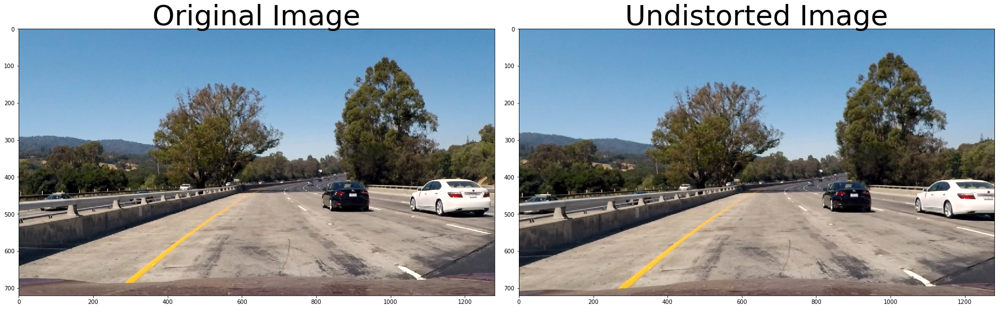

In [6]:
testimg = cv2.imread('./test_images/test1.jpg')
test_undistorted = undistort(testimg, objpoints, imgpoints)

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(cv2.cvtColor(testimg, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=50)

ax2.imshow(cv2.cvtColor(test_undistorted, cv2.COLOR_BGR2RGB))
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

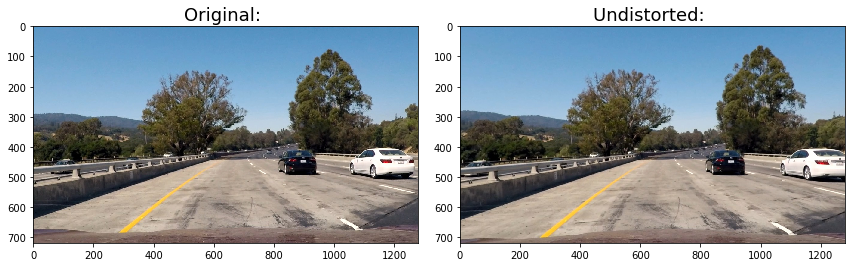

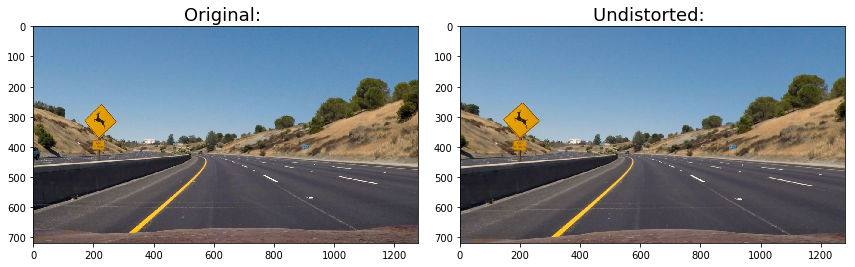

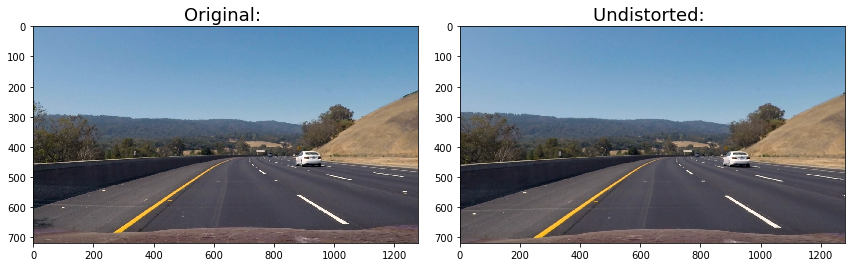

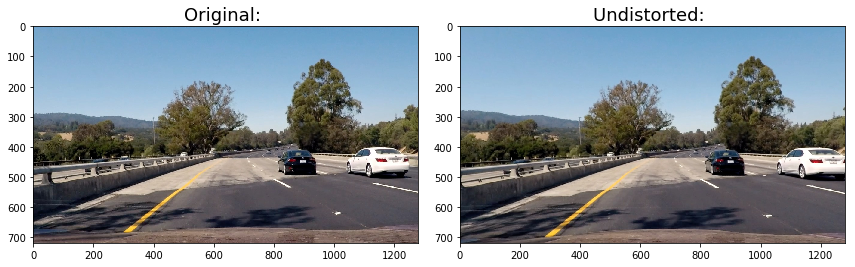

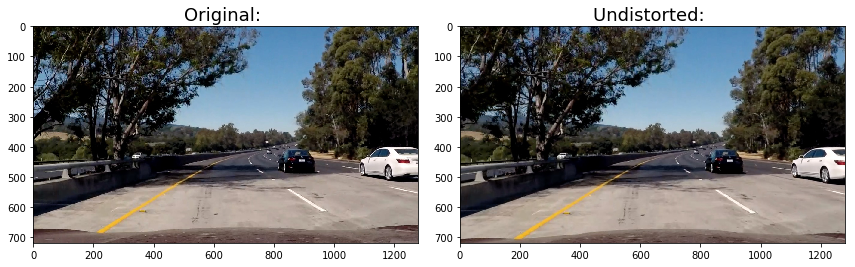

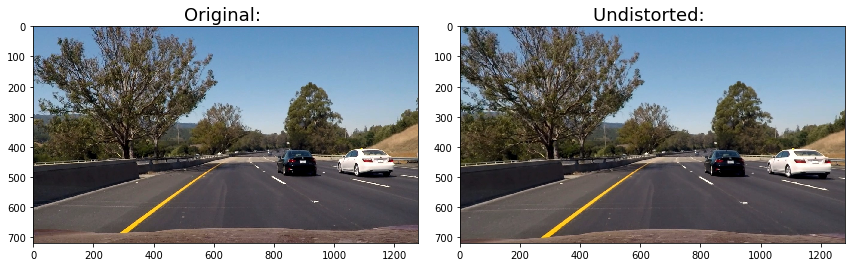

In [7]:
road_images = glob.glob('./test_images/test*.jpg')

for image in road_images:
    image = cv2.imread(image)
    #gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    undistorted = undistort(image, objpoints, imgpoints)
    
    #filename = 'output_'+ str(road_images[n])

    #plotting the original and undistorted iamge next to each other
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,8))
    f.tight_layout()
    #Aplying the colour 
    #ax1.imshow(cv2.cvtColor(cv2.imread(image), cv2.COLOR_BGR2RGB))
    ax1.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)) 
    #ax1.set_title("Original: " + image , fontsize=18)
    ax1.set_title("Original: ", fontsize=18)
    ax2.imshow(cv2.cvtColor(undistorted, cv2.COLOR_BGR2RGB))
    ax2.set_title("Undistorted: ", fontsize=18)

## Color and gradient thresholds 
Applying thresholds to create a binary image.
The same test image as teh undistorted example is used throughout the threshold examples below. 

In [8]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Calculate directional gradient
    # Apply threshold
        # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    # 3) Take the absolute value of the derivative or gradient

    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    #Convert the absolute value image to 8-bit:
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    # 5) Create a mask of 1's where the scaled gradient magnitude 
    grad_binary = np.zeros_like(scaled_sobel)
    grad_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    
    return grad_binary

Text(0.5,1,'Sobel y Threshold: ')

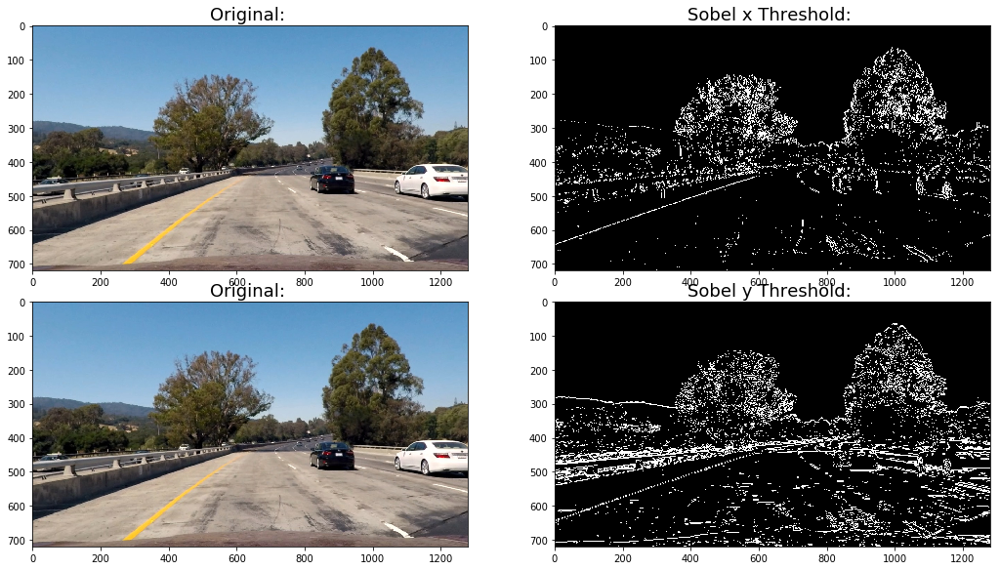

In [9]:
#testimg = cv2.imread('C:/Users/lovesa/Desktop/Self_Driving_Engineer_Course/Project-2-Advanced_Line_Finding/Project2Submission/test_images/test1.jpg')

# Choose a Sobel kernel size
ksize = 3 # Choose a larger odd number to smooth gradient measurements

gradx = abs_sobel_thresh(test_undistorted, orient='x', sobel_kernel=ksize, thresh=(20, 100))
grady = abs_sobel_thresh(test_undistorted, orient='y', sobel_kernel=ksize, thresh=(20, 100))

#plotting the original and Sobel iamge next to each other
f, ((ax1, ax2),(ax3, ax4)) = plt.subplots(2, 2, figsize=(15,8))
f.tight_layout()
ax1.imshow(cv2.cvtColor(test_undistorted, cv2.COLOR_BGR2RGB))
ax1.set_title("Original: " , fontsize=18)
ax2.imshow(gradx, cmap='gray')
ax2.set_title("Sobel x Threshold: ", fontsize=18)
ax3.imshow(cv2.cvtColor(test_undistorted, cv2.COLOR_BGR2RGB))
ax3.set_title("Original: ", fontsize=18)
ax4.imshow(grady, cmap='gray')
ax4.set_title("Sobel y Threshold: ", fontsize=18)

In [10]:
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Calculate gradient magnitude
    # Apply threshold
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        
    # 2) Take the gradient in x and y separately
    #Calculate the derivative in the xx direction (the 1, 0 at the end denotes xx direction):
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    #Calculate the derivative in the yy direction (the 0, 1 at the end denotes yy direction):
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # 3) Calculate the magnitude 
    #The magnitude, or absolute value, of the gradient is the square root of the squares of the individual x and y gradients.
    #For a gradient in both the xx and yy directions, the magnitude is the square root of the sum of the squares.  
    abs_sobelxy = np.sqrt((sobelx**2)+(sobely**2))
    
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    #scaled_sobel = np.uint8(255*abs_sobelxy/np.max(abs_sobelxy))
    scale_factor = np.max(abs_sobelxy)/255 
    grad_mag = (abs_sobelxy/scale_factor).astype(np.uint8) 
    
    # 5) Create a binary mask where mag thresholds are met
    mag_binary = np.zeros_like(grad_mag)
    mag_binary[(grad_mag >= mag_thresh[0]) & (grad_mag <= mag_thresh[1])] = 1
    
    return mag_binary

Text(0.5,1,'Magnitude Threshold: ')

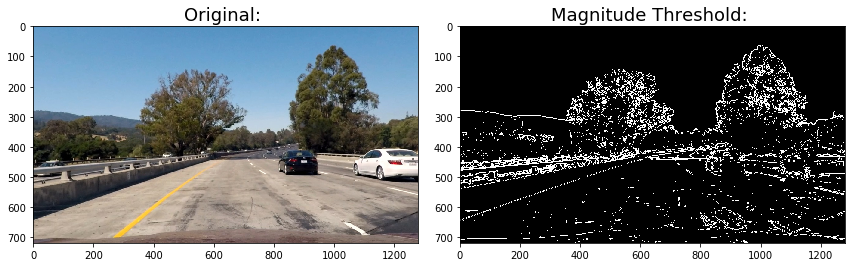

In [11]:
#testimg = cv2.imread('C:/Users/lovesa/Desktop/Self_Driving_Engineer_Course/Project-2-Advanced_Line_Finding/Project2Submission/test_images/test1.jpg')

# Choose a Sobel kernel size
ksize = 3 # Choose a larger odd number to smooth gradient measurements

mag_binary = mag_thresh(test_undistorted, sobel_kernel=ksize, mag_thresh=(30, 100))

#plotting the original and gradient magnitude image next to each other
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,8))
f.tight_layout()
ax1.imshow(cv2.cvtColor(test_undistorted, cv2.COLOR_BGR2RGB))
ax1.set_title("Original: ", fontsize=18)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title("Magnitude Threshold: ", fontsize=18)


In [12]:
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Calculate gradient direction
    # Apply threshold
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    #Calculate the derivative in the yy direction (the 0, 1 at the end denotes yy direction):
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # 3) Take the absolute value of the x and y gradients
    #Calculate the absolute value of the xx derivative:
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)

    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    grad_dir = np.arctan2(abs_sobely, abs_sobelx)
    
    # 5) Create a binary mask where direction thresholds are met
    dir_binary = np.zeros_like(grad_dir)
    dir_binary[(grad_dir >= thresh[0]) & (grad_dir <= thresh[1])] = 1
    
    return dir_binary

Text(0.5,1,'Direction Threshold: ')

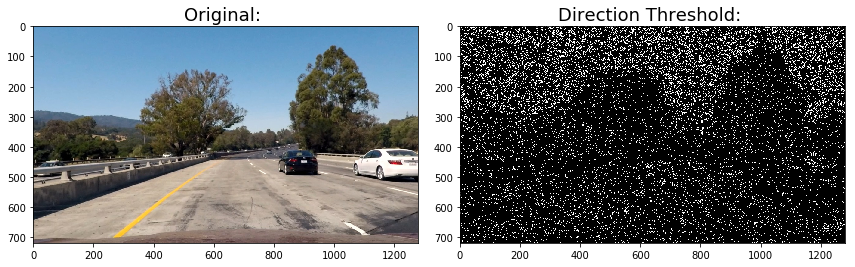

In [13]:
dir_binary = dir_threshold(test_undistorted, sobel_kernel=ksize, thresh=(0.7, 0.8))

#plotting the original and gradient direction threshold image next to each other
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,8))
f.tight_layout()
ax1.imshow(cv2.cvtColor(test_undistorted, cv2.COLOR_BGR2RGB))
ax1.set_title("Original: ", fontsize=18)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title("Direction Threshold: ", fontsize=18)

The above images show the thresholds applied individually to the image.

Below, other colour techniques are used to see how the lane lines are detected.
RGB - Red, Blue, Green
HSV - Hue, Saturation, Value
HSL - Hue, Saturation, Lightness

In [14]:
def RGB_HLS_HSV(img):
    
    #covert to gray
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    
    # Separate the RGB
    Red = img[:,:,0]
    Green = img[:,:,1]
    Blue = img[:,:,2]

    # Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    h_channel_hls = hls[:,:,0]
    l_channel_hls = hls[:,:,1]
    s_channel_hls = hls[:,:,2]

    # Convert to HSV color space
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV).astype(np.float)
    h_channel_hsv = hsv[:,:,0]
    s_channel_hsv = hsv[:,:,1]
    v_channel_hsv = hsv[:,:,2]
    return Red, Green, Blue, h_channel_hls,l_channel_hls,s_channel_hls,h_channel_hsv,s_channel_hsv,v_channel_hsv

Text(0.5,1,'V_channel_hsv')

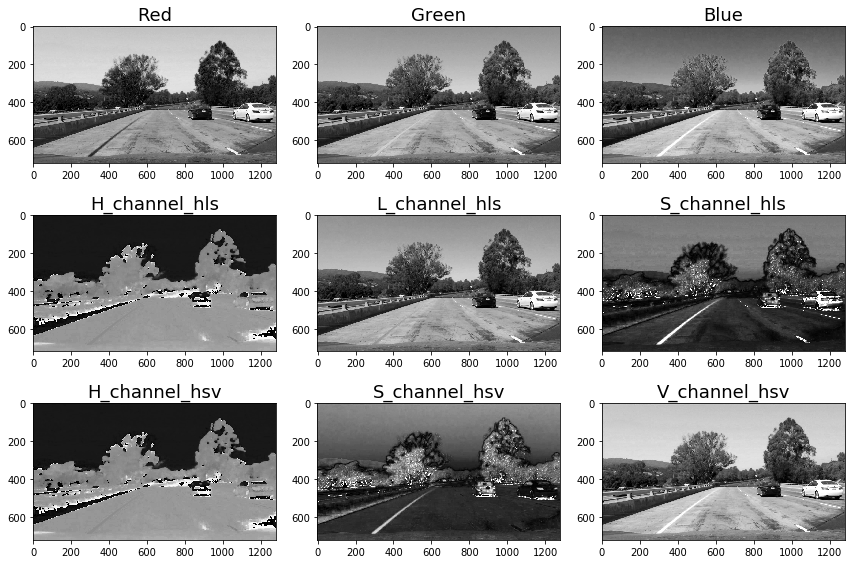

In [15]:
#Using the same test image as above
test_img = cv2.imread('./test_images/test1.jpg')

Red,Green, Blue, h_channel_hls,l_channel_hls,s_channel_hls,h_channel_hsv,s_channel_hsv,v_channel_hsv = RGB_HLS_HSV(test_img)



# Plot the source points on the original image and the warped image
f, ((ax1, ax2, ax3), (ax4, ax5, ax6), (ax7, ax8, ax9)) = plt.subplots(3, 3, figsize=(12,8))
f.tight_layout()

# Plot RGB colours
ax1.imshow(Red, cmap='gray')
ax1.set_title('Red', fontsize=18)
ax2.imshow(Green, cmap='gray')
ax2.set_title('Green', fontsize=18)
ax3.imshow(Blue, cmap='gray')
ax3.set_title('Blue', fontsize=18)

# Plot HLS colours
ax4.imshow(h_channel_hls, cmap='gray')
ax4.set_title('H_channel_hls', fontsize=18)
ax5.imshow(l_channel_hls, cmap='gray')
ax5.set_title('L_channel_hls', fontsize=18)
ax6.imshow(s_channel_hls, cmap='gray')
ax6.set_title('S_channel_hls', fontsize=18)

# Plot HSV colours
ax7.imshow(h_channel_hsv, cmap='gray')
ax7.set_title('H_channel_hsv', fontsize=18)
ax8.imshow(s_channel_hsv, cmap='gray')
ax8.set_title('S_channel_hsv', fontsize=18)
ax9.imshow(v_channel_hsv, cmap='gray')
ax9.set_title('V_channel_hsv', fontsize=18)


It's evident that certain colours bring out better results. It looks like the R, B, S and V colours produce the best results.

In [16]:
def Color_threshold(img, sobel_kernel=3, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0, ksize = sobel_kernel) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    # Stack each channel
    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
    
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    
    return combined_binary


Text(0.5,1,'Color Threshold: ')

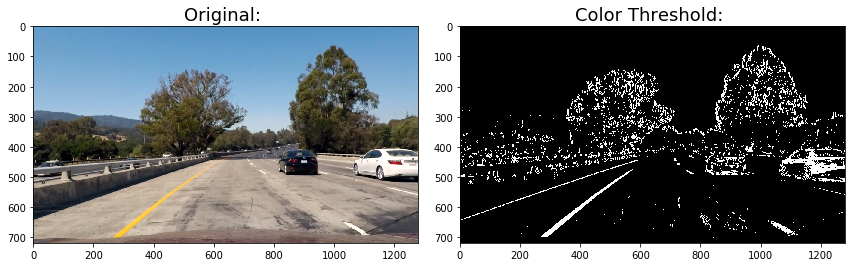

In [17]:
ksize = 9
Transformed_im = Color_threshold(test_undistorted, ksize, s_thresh=(160, 255), sx_thresh=(30, 100))


#plotting the original and colour gradient threshold image next to each other
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,8))
f.tight_layout()
ax1.imshow(cv2.cvtColor(test_undistorted, cv2.COLOR_BGR2RGB))
ax1.set_title("Original: ", fontsize=18)
#ax2.imshow(color_binary)
ax2.imshow(Transformed_im, cmap='gray')
ax2.set_title("Color Threshold: ", fontsize=18)

Below the thresholds are combined to acheive the best results. 

## Perspective transform.

In [18]:
# Compute and apply perpective transform
def warp(img):

    #define calibration box in source (original) and destination(warped) coordinates
    img_size =(img.shape[1],img.shape[0])

    #your source coordinates
    #src = np.float32 () #enter point matrix in the brackets
    src = np.array([[205, 720], [1120, 720], [745, 480], [550, 480]], np.float32)
    dst = np.array([[205, 720], [1120, 720], [1120, 0], [205, 0]], np.float32)

    #Compute the perspective transform, M, given source and destination points:
    M = cv2.getPerspectiveTransform(src, dst)

    #Could compute the inverse perspective transform:
    Minv = cv2.getPerspectiveTransform(dst, src)

    #Warp an image using the perspective transform, M:
    warped_img = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR) # keep same size as input image

    return warped_img, Minv

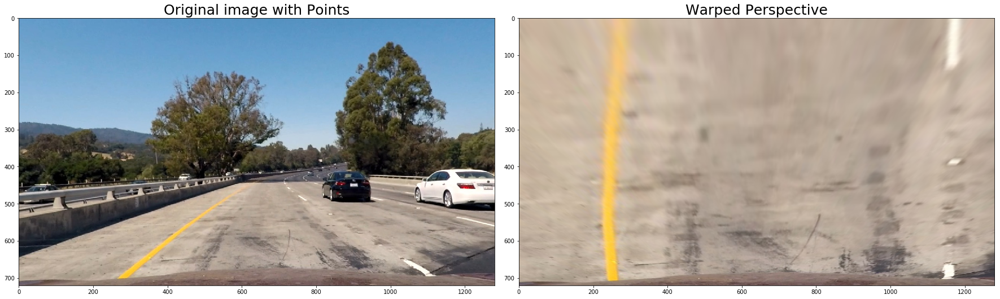

In [19]:
#get perspective transform
warped_im, Minv = warp(test_undistorted)

# Plot the source points on the original image and the warped image
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(cv2.cvtColor(test_undistorted, cv2.COLOR_BGR2RGB))
ax1.set_title('Original image with Points', fontsize=25)
ax2.imshow(cv2.cvtColor(warped_im, cv2.COLOR_BGR2RGB))
ax2.set_title('Warped Perspective', fontsize=25)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [20]:
#Want to see the four points for the perspective transform

src = np.array([[205, 720], [1120, 720], [745, 480], [550, 480]], np.float32)
dst = np.array([[205, 720], [1120, 720], [1120, 0], [205, 0]], np.float32)

def draw_source(img, src):
    img = np.copy(img)
    color = [255, 0, 0] # Red
    thickness = 5
    radius = 15
    x0, y0 = src[0]
    x1, y1 = src[1]
    x2, y2 = src[2]
    x3, y3 = src[3]
    cv2.line(img, (x0, y0), (x1, y1), color, thickness)
    cv2.line(img, (x1, y1), (x2, y2), color, thickness)
    cv2.line(img, (x2, y2), (x3, y3), color, thickness)
    cv2.line(img, (x3, y3), (x0, y0), color, thickness)
    cv2.circle(img, (x0, y0), radius, color, thickness)
    cv2.circle(img, (x1, y1), radius, color, thickness)
    cv2.circle(img, (x2, y2), radius, color, thickness)
    cv2.circle(img, (x3, y3), radius, color, thickness)
    return img

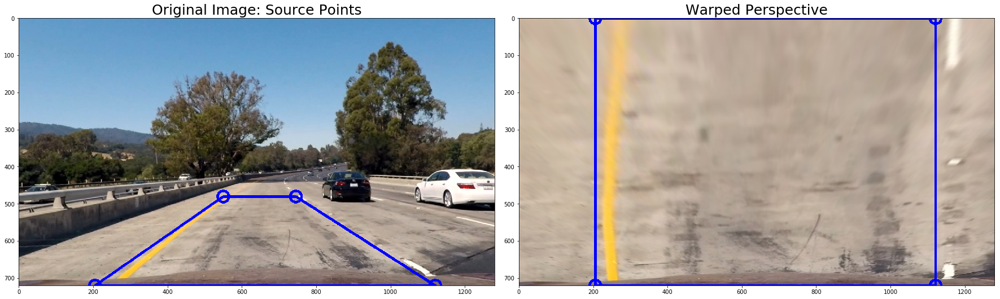

In [21]:
# add the points to the og and warped images 
src_points_img = draw_source(test_undistorted, src)
dst_points_warped = draw_source(warped_im, dst)
# Plot the source points on the original image and the warped image
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(cv2.cvtColor(src_points_img, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image: Source Points', fontsize=25)
ax2.imshow(cv2.cvtColor(dst_points_warped, cv2.COLOR_BGR2RGB))
ax2.set_title('Warped Perspective', fontsize=25)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

Those same four source points will now work to transform any image (again, under the assumption that the road is flat and the camera perspective hasn't changed). We will now run these functions over all the road test images. The lane lines should appear parallel in the warped images, whether they are straight or curved

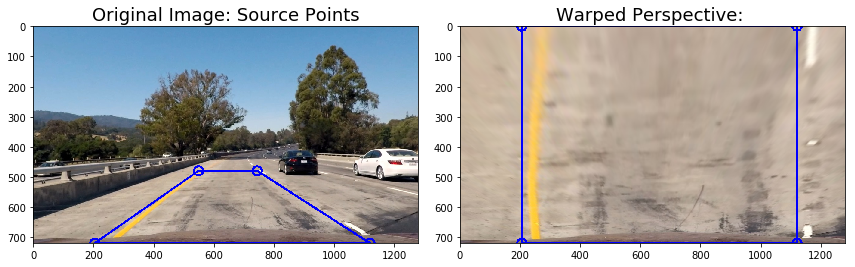

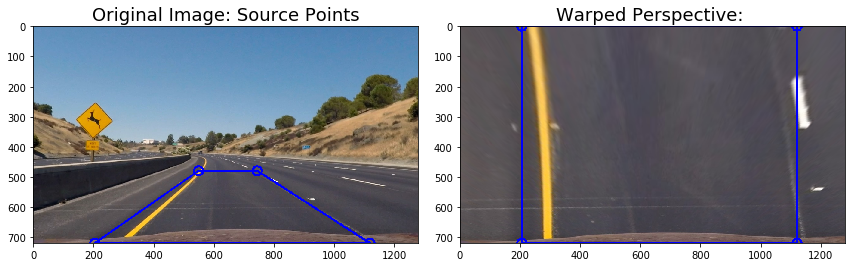

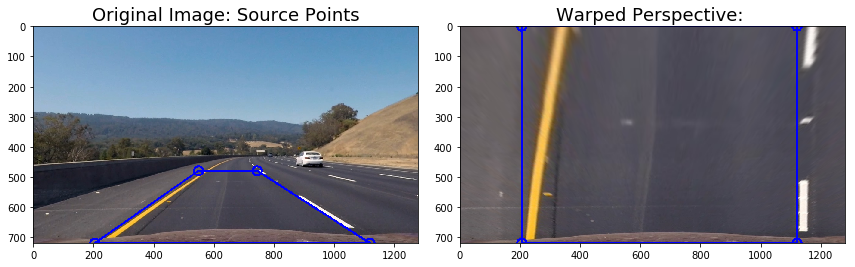

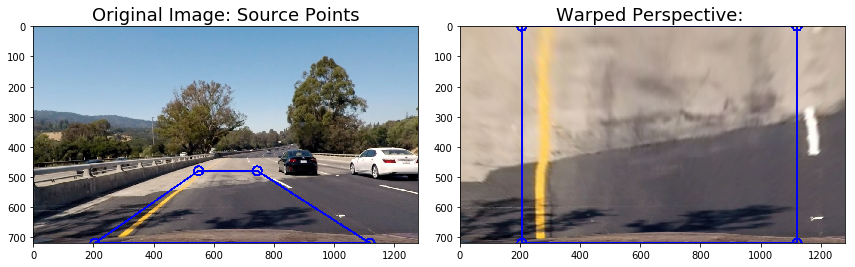

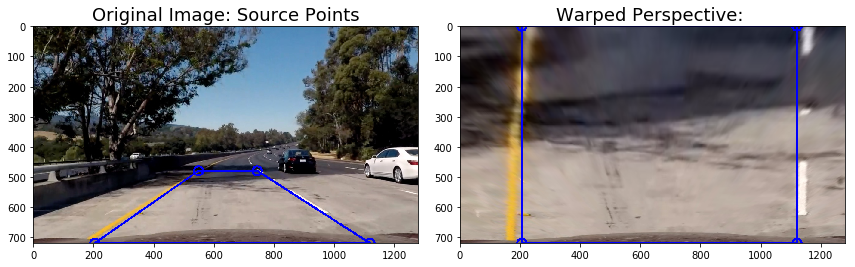

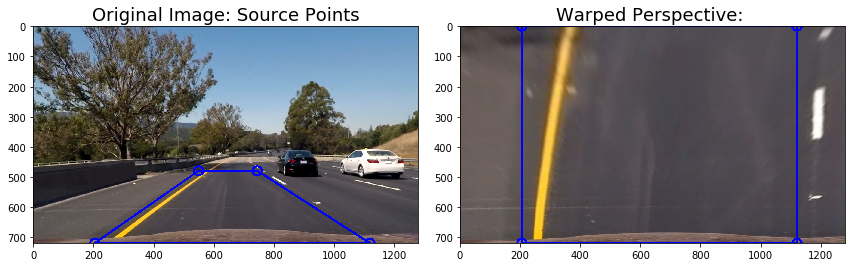

In [22]:
road_images = glob.glob('./test_images/test*.jpg')

for image in road_images:
    img = cv2.imread(image)
    
    #resizing the image to be the same as the calibration matrix training images
    img = cv2.resize(img, (1280, 720))
    undistorted = undistort(img, objpoints, imgpoints)
    warped_im, Minv = warp(undistorted)
    src_points_img = draw_source(undistorted, src)
    dst_points_warped = draw_source(warped_im, dst)
        
    #plotting the original and warped images next to each other
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,8))
    f.tight_layout()
    #Aplying the colour 
    #ax1.imshow(cv2.cvtColor(cv2.imread(image), cv2.COLOR_BGR2RGB))
    ax1.imshow(cv2.cvtColor(src_points_img, cv2.COLOR_BGR2RGB))
    ax1.set_title("Original Image: Source Points", fontsize=18)
    ax2.imshow(cv2.cvtColor(dst_points_warped, cv2.COLOR_BGR2RGB))
    ax2.set_title("Warped Perspective: ", fontsize=18)

We can see that the warped perspective captures the lane lines, and shows they are fairly parallel to one another. Below are the warped images again, but with the thresholding applied to detect the lanes. 

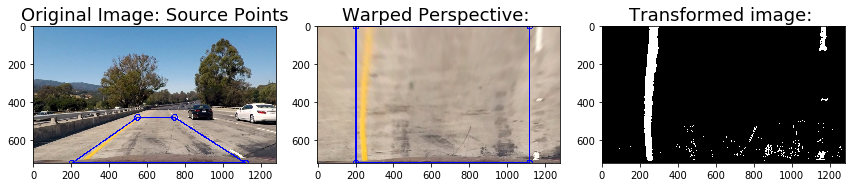

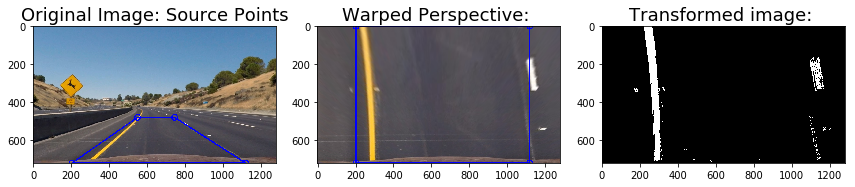

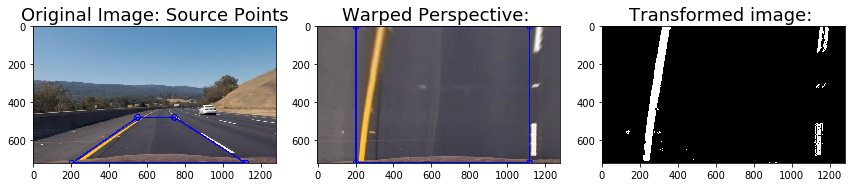

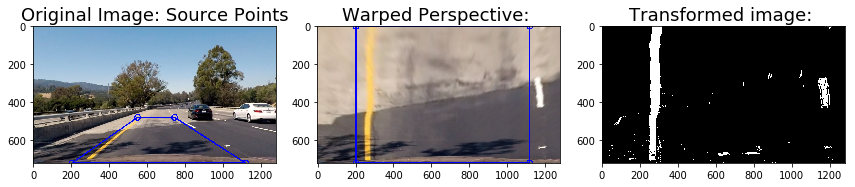

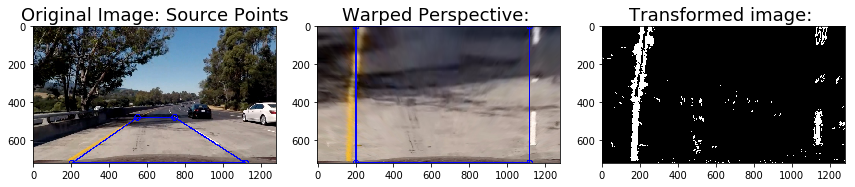

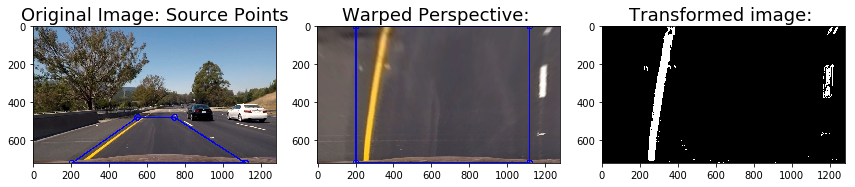

In [23]:
road_images = glob.glob('./test_images/test*.jpg')

for image in road_images:
    img = cv2.imread(image)

    #resizing the image to be the same as the calibration matrix training images
    img = cv2.resize(img, (1280, 720))
    undistorted = undistort(img, objpoints, imgpoints)
    warped_im, Minv = warp(undistorted)
    src_points_img = draw_source(undistorted, src)
    dst_points_warped = draw_source(warped_im, dst)
   
    #Combining the sobel, magnitude and direction thresholds
    ksize = 9
    Transformed_im = Color_threshold(warped_im, ksize, s_thresh=(140, 255), sx_thresh=(30, 100))
           
    #plotting the original and transformed iamge next to each other
    f,(ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12,8))
    f.tight_layout()
    #Aplying the colour 
    ax1.imshow(cv2.cvtColor(src_points_img, cv2.COLOR_BGR2RGB))
    ax1.set_title("Original Image: Source Points", fontsize=18)
    ax2.imshow(cv2.cvtColor(dst_points_warped, cv2.COLOR_BGR2RGB))
    #ax2.imshow(dst_points_warped, cmap='gray')
    ax2.set_title("Warped Perspective: ", fontsize=18)
    ax3.imshow(Transformed_im, cmap='gray')
    ax3.set_title("Transformed image: ", fontsize=18)

# Polynomial fitting

Here the code determines which pixels are part of the lane lines, and which belong to the left, and right lanes. This was done by plotting a histogram of where the binary activations occur across the image.

In [24]:
def hist(img):
    # Grab only the bottom half of the image
    # Lane lines are likely to be mostly vertical nearest to the car
    bottom_half = img[img.shape[0]//2:,:]

    # Sum across image pixels vertically - make sure to set `axis`
    # i.e. the highest areas of vertical lines should be larger values
    histogram = np.sum(bottom_half, axis=0)
    
    return histogram

Text(0.5,1,'Warped image')

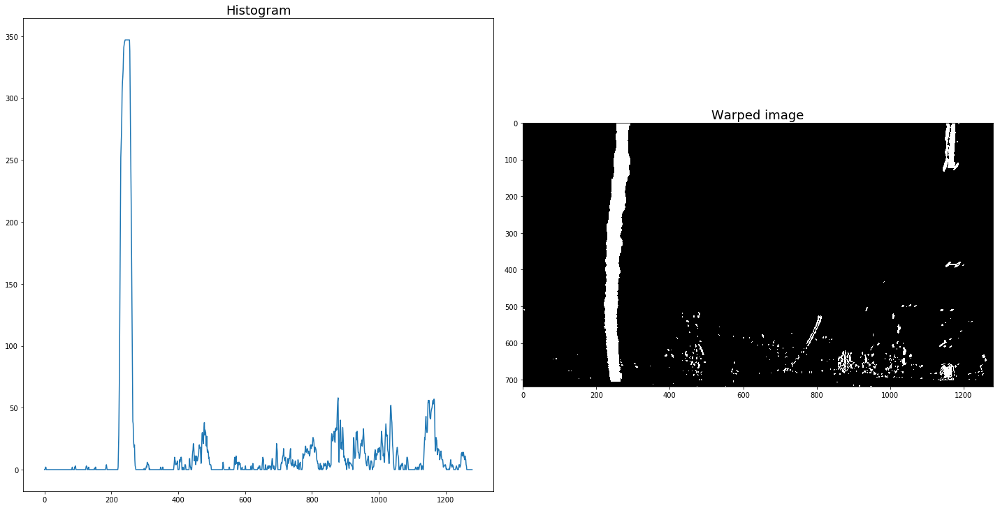

In [25]:
testimg = cv2.imread('./test_images/test1.jpg')
img = cv2.resize(testimg, (1280, 720))  

undistorted = undistort(img, objpoints, imgpoints)
warped_im, Minv = warp(undistorted)
#Combining the sobel, magnitude and direction thresholds
ksize = 9
Transformed_im = Color_threshold(warped_im, ksize, s_thresh=(160, 255), sx_thresh=(30, 100))

# Create histogram of image binary activations
histogram = hist(Transformed_im)

#histogram = np.sum(img[img.shape[0]/2:,:], axis = 0)

# Visualize the resulting histogram
#plt.plot(histogram)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.tight_layout()
ax1.plot(histogram)
ax1.set_title("Histogram", fontsize=18)
ax2.imshow(Transformed_im, cmap='gray')
ax2.set_title("Warped image", fontsize=18)


In the thresholded binary image, pixels are either 0 or 1. We expect our lane lines to be (mostly) vertically-oriented
the two most prominent peaks in this histogram will be good indicators of the x-position of the base of the lane lines. From here can search for the lines using a sliding window placed around the centres of the left/right lanes to follow the lines up to the top of the frame

In [26]:
#Splitting the histogram for the two lines

# Load our image
img = mpimg.imread('./test_images/test1.jpg')


def find_lane_pixels(img, nwindows=9, margin=100, minpix=50):
    
    img = cv2.resize(img, (1280, 720))
    #Where input image is the binary warped image
    # Take a histogram of the bottom half of the image
    histogram = np.sum(img[img.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((img, img, img))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    #nwindows = 12
    # Set the width of the windows +/- margin
    #margin = 80
    # Set minimum number of pixels found to recenter window
    #minpix = 40

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(img.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = img.shape[0] - (window+1)*window_height
        win_y_high = img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def fit_polynomial(img, nwindows=9, margin=100, minpix=50):
    #img is binary warped
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(img, nwindows=nwindows, margin=margin, minpix=minpix)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    #plt.plot(left_fitx, ploty, color='yellow')
    #plt.plot(right_fitx, ploty, color='yellow')

    return out_img,left_fitx, right_fitx, ploty, left_fit, right_fit

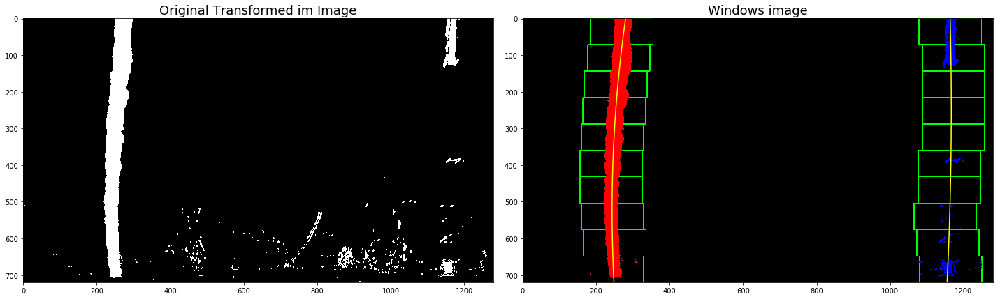

In [27]:
# Load our image
img = mpimg.imread('./test_images/test1.jpg')

img = cv2.resize(img, (1280, 720))  

undistorted = undistort(img, objpoints, imgpoints)
warped_im, Minv = warp(undistorted)
#Combining the sobel, magnitude and direction thresholds
ksize = 9
Transformed_im = Color_threshold(warped_im, ksize, s_thresh=(140, 255), sx_thresh=(30, 100))

out_img, left_fitx, right_fitx, ploty, left_fit, right_fit = fit_polynomial(Transformed_im, nwindows=10, margin=85, minpix=20)

#plt.plot(left_fitx, ploty, color='yellow')
#plt.plot(right_fitx, ploty, color='yellow')
#plt.imshow(out_img)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.tight_layout()
ax1.imshow(Transformed_im,  cmap='gray')
ax1.set_title("Original Transformed im Image", fontsize=18)
ax2.imshow(out_img, cmap='gray')
ax2.set_title("Windows image", fontsize=18)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')


Skip the sliding windows step once you've found the lines. The algorithm is adjusted to search in a margin around the previous lane position, this is more efficient as the lanes lines do not move much from frame to frame

In [28]:
##### Polynomial fit values from the previous frame
# Make sure to grab the actual values from the previous step in your project!


"""
left_fit = np.array([ 2.13935315e-04, -3.77507980e-01,  4.76902175e+02])
right_fit = np.array([4.17622148e-04, -4.93848953e-01,  1.11806170e+03])

def fit_poly(img_shape, leftx, lefty, rightx, righty):
     ### TO-DO: Fit a second order polynomial to each with np.polyfit() ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fitx, right_fitx, ploty

"""


def detect_close_lines(img, left_fit, right_fit, margin=100):
    #img is binary warped img
    
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    #margin = 150

    # Grab activated pixels
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # TO-DO: Set the area of search based on activated x-values #
    # within the +/- margin of our polynomial function
    # Hint: consider the window areas for the similarly named variables 
    # in the previous quiz, but change the windows to our new search area 
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    #left_fitx, right_fitx, ploty = fit_poly(img.shape, leftx, lefty, rightx, righty)
    out_img, left_fitx, right_fitx, ploty, left_fit, right_fit = fit_polynomial(Transformed_im, nwindows=9, margin=100, minpix=50)
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((img, img, img))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    # Plot the polynomial lines onto the image
    #plt.plot(left_fitx, ploty, color='yellow')
    #plt.plot(right_fitx, ploty, color='yellow')
    ## End visualization steps ##
    
    return result, left_fitx, right_fitx, ploty, leftx, rightx

[339 340 341 ... 356 355 356] [1241 1242 1243 ... 1237 1238 1239]


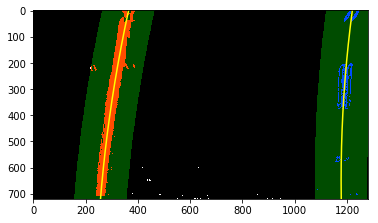

In [53]:
# Run image through the pipeline
# Note that in your project, you'll also want to feed in the previous fits
out_img, left_fitx, right_fitx, ploty, left_fit, right_fit = fit_polynomial(Transformed_im, nwindows=9, margin=100, minpix=50)

result, left_fitx, right_fitx, ploty, leftx, rightx = detect_close_lines(Transformed_im, left_fit, right_fit, margin=100)
# Plot the polynomial lines onto the image
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
# View your output
plt.imshow(result)

#print(left_fitx, right_fitx)
print(leftx, rightx)

# road_images = glob.glob('./test_images/test*.jpg')

for image in road_images:
    img = cv2.imread(image)
    
    img_og = np.copy(img)

    #Applying the distortion, binary thresholding, warping to the image
    undistorted = undistort(img_og, objpoints, imgpoints)
    warped_im, Minv = warp(undistorted)

    #Combining the sobel, magnitude and direction thresholds
    ksize = 9
    Transformed_im = Color_threshold(warped_im, ksize, s_thresh=(140, 255), sx_thresh=(30, 100))

    out_img, left_fitx, right_fitx, ploty, left_fit, right_fit = fit_polynomial(Transformed_im,  nwindows=10, margin=85, minpix=20)

    result, left_fitx, right_fitx, ploty, leftx, rightx = detect_close_lines(Transformed_im, left_fit, right_fit, margin=60)
 
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.tight_layout()
    ax1.imshow(Transformed_im,  cmap='gray')
    ax1.set_title("Original Transformed im Image", fontsize=18)
    ax2.imshow(result, cmap='gray')
    ax2.set_title("Windows image", fontsize=18)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')

The plots look like the lines are well defined, with the exception of test1 image. 

Next the curvature of the lane is to be determined. 
Radius equation is used as defined in the lectures 

"""
def measure_curvature_pixels():
    '''
    Calculates the curvature of polynomial functions in pixels.
    '''
    #ploty, left_fit, right_fit = generate_data(ym_per_pix, xm_per_pix) #feed in real data here
    result,left_fitx, right_fitx, ploty = search_around_poly(Transformed_im)

    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fitx[0]*y_eval + left_fitx[1])**2)**1.5) / np.absolute(2*left_fitx[0])
    right_curverad = ((1 + (2*right_fitx[0]*y_eval + right_fitx[1])**2)**1.5) / np.absolute(2*right_fitx[0])
    
    return left_curverad, right_curverad
"""

#Calculate the radius of curvature in pixels for both lane lines
left_curverad, right_curverad = measure_curvature_pixels()

print('Radius of curvature Left is:' ,left_curverad, 'pixels')
print('Radius of curvature Right is:', right_curverad, 'pixels')

In [31]:
def measure_curvature_real():
    '''
    Calculates the curvature of polynomial functions in meters.
     tune your algorithm to report close to a radius of 1 km
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Start by generating our fake example data
    # Make sure to feed in your real data instead in your project!
    result, left_fitx, right_fitx, ploty, leftx, rightx = detect_close_lines(Transformed_im, left_fit, right_fit, margin=100)

        
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    
    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    return left_curverad, right_curverad, xm_per_pix

In [32]:
# Calculate the radius of curvature in meters for both lane lines
left_curverad, right_curverad, xm_per_pix = measure_curvature_real()

print(left_curverad, 'm', right_curverad, 'm')

#curve_m = (left_curverad + right_curverad) / 2.

1733.353966031199 m 1607.2371422716265 m


In [33]:
def centre_dist(y_eval, midpoint, left_fit, right_fit, xm_per_pix):
    #y_eval = np.max(ploty)
    
    #centre = img.shape[1] / 2
    
    # Calculate the distance from the center
    x_left_line = left_fit[0]*(y_eval**2) + left_fit[1]*y_eval + left_fit[2]
    x_right_line = right_fit[0]*(y_eval**2) + right_fit[1]*y_eval + right_fit[2]
    
    dist_from_centre = ((x_left_line + x_right_line)/2 - midpoint) * xm_per_pix
    
    return dist_from_centre

In [34]:
y_eval = img.shape[0]
midx = img.shape[1] / 2
centre = centre_dist(y_eval, midx, left_fit, right_fit, xm_per_pix)
print(centre, 'm')

0.40954617670726534 m


In [35]:
# Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position
# Add the radius and center

def add_text(img, curve_rad, centre):
    out_img = np.copy(img)
    font = cv2.FONT_HERSHEY_SIMPLEX
    text = 'Radius of Curvature (average): ' + '{:04.0f}'.format(curve_rad) + 'm'
    cv2.putText(out_img, text, (50,50), font, 1.5, (255,255,255), 2, cv2.LINE_AA)
    if centre < 0:
        dir = 'left'
    else:
        dir = 'right'
    text2 ='Vehicle is {:.2f}'.format(centre) + 'm '+ dir + ' of centre'
    cv2.putText(out_img, text2, (50,100), font, 1.5,(255,255,255), 2, cv2.LINE_AA)
    
    return out_img

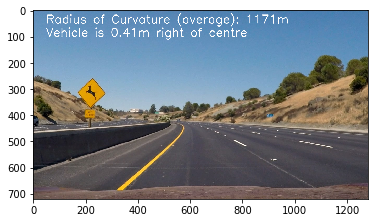

In [36]:
img = mpimg.imread('./test_images/test2.jpg')
#resizing the image to be the same as the calibration matrix training images
img = cv2.resize(img, (1280, 720))
img_og = np.copy(img)

#Applying the distortion, binary thresholding, warping to the image
undistorted = undistort(img_og, objpoints, imgpoints)
warped_im, Minv = warp(undistorted)

#Combining the sobel, magnitude and direction thresholds
ksize = 9
Transformed_im = Color_threshold(warped_im, ksize, s_thresh=(140, 255), sx_thresh=(30, 100))

#Finding the lane lines
y_eval = img.shape[0]
midx = img.shape[1] / 2

# calc the radius and center distance
left_curverad, right_curverad, xm_per_pix = measure_curvature_real()
avg_curve_m = (left_curverad + right_curverad) / 2.
centre = centre_dist(y_eval, midx, left_fit, right_fit, xm_per_pix)

# Draw the lines on the edge image
addtext = add_text(img_og, avg_curve_m, centre)

plt.imshow(addtext)

In [37]:
def add_polygon(img, Transformed_im,left_fit, right_fit, Minv):
    
    img = cv2.resize(img, (1280, 720))
    Transformed_im=cv2.resize(Transformed_im, (1280, 720))
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(Transformed_im).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    img_size =(img.shape[1],img.shape[0])
    #color_warp = np.zeros_like(img).astype(np.uint8)
    # define range
    ploty = np.linspace(0, Transformed_im.shape[0]-1, Transformed_im.shape[0])
    
    # fit lines, generate x and y values for plotting
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    #chosen green to match example
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(0,0,255), thickness=20)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,0,255), thickness=20)
    
    # Warp the blank back to original image space using inverse perspective matrix 
    # Compute and apply inverse perpective transform
    #Minv = cv2.getPerspectiveTransform(dst, src)
    #unwarped_img = cv2.warpPerspective(color_warp, Minv, img_size, flags=cv2.INTER_NEAREST)
    unwarped_img = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0]), flags=cv2.WARP_FILL_OUTLIERS+cv2.INTER_CUBIC)

    lines_img = cv2.addWeighted(img, 1, unwarped_img, 0.3, 0)
    
    return lines_img


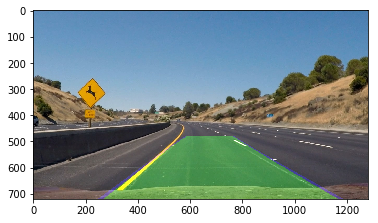

In [38]:
#SHowing the polygon plotted
img = mpimg.imread('./test_images/test2.jpg')
#resizing the image to be the same as the calibration matrix training images
img = cv2.resize(img, (1280, 720))

img_og = np.copy(img)

#Applying the distortion, binary thresholding, warping to the image
undistorted = undistort(img_og, objpoints, imgpoints)
warped_im, Minv = warp(undistorted)

#Combining the sobel, magnitude and direction thresholds
ksize = 9
Transformed_im = Color_threshold(warped_im, ksize, s_thresh=(140, 255), sx_thresh=(30, 100))

#Finding the lane lines
y_eval = img.shape[0]
midx = img.shape[1] / 2

# calc the radius and center distance
centre = centre_dist(y_eval, midx, left_fit, right_fit, xm_per_pix)

# Draw the lines on the edge image
#unwarped = unwarp(binary)
draw_lines = add_polygon(img_og, Transformed_im, left_fit, right_fit, Minv)
#final_result = add_text(draw_lines, avg_curve_m, centre)

plt.imshow(draw_lines)

#If there is no previous lane fit, fit a new lane and directly use it.
#Otherwise, fit a new lane but perform a sanity check on it.
#If the sanity check does not pass, use the previous fit.

def lane_exists():
    
    
    
    
    return

## Final Pipeline

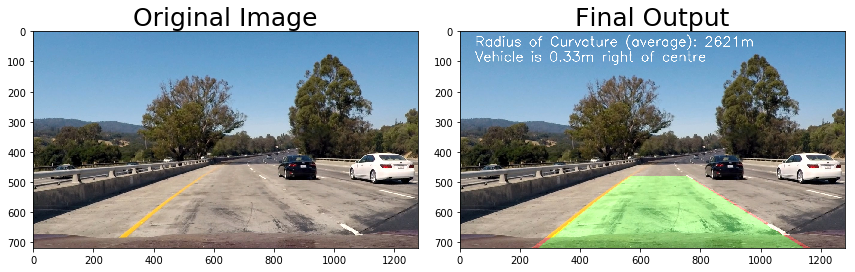

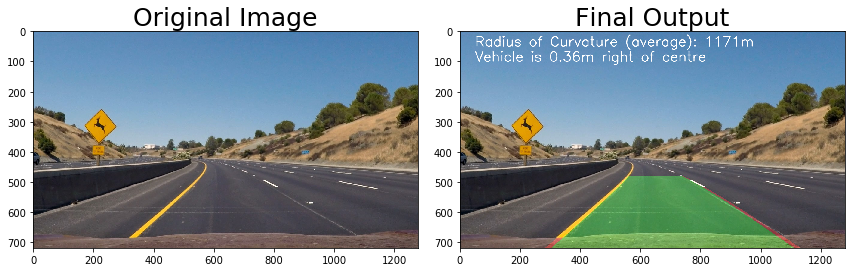

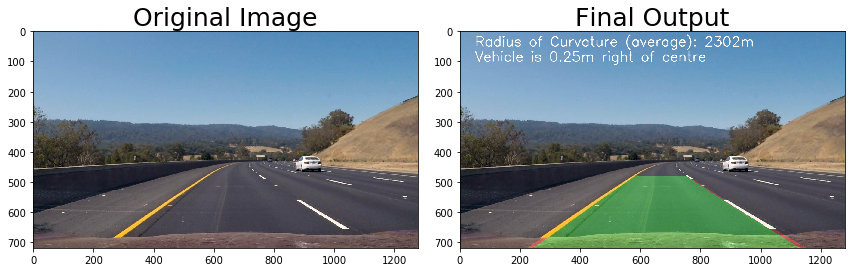

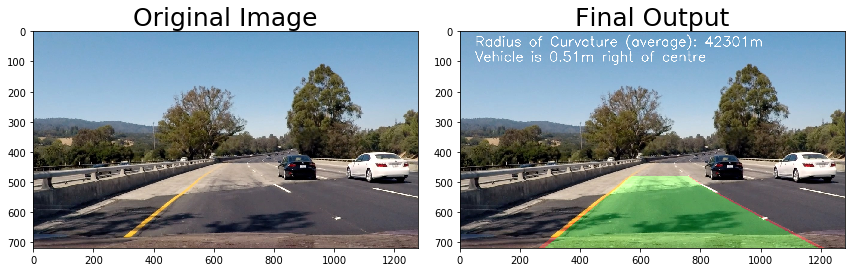

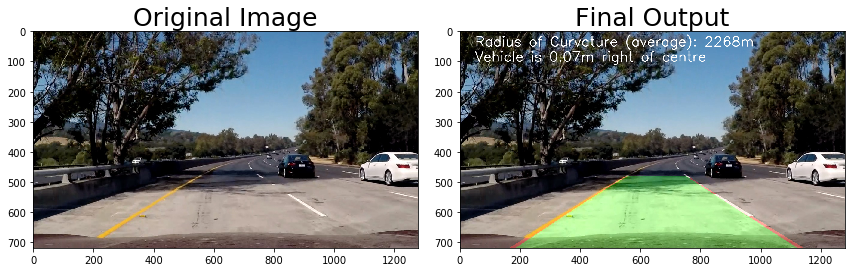

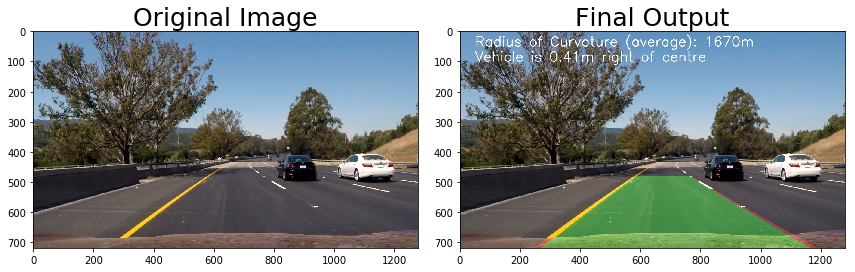

In [39]:
## Placeholder for final pipeline example

road_images = glob.glob('./test_images/test*.jpg')

for image in road_images:
    img = cv2.imread(image)
    
    #final_result = pipeline(img)
    
    #resizing the image to be the same as the calibration matrix training images
    img = cv2.resize(img, (1280, 720))

    img_og = np.copy(img)

    #Applying the distortion, binary thresholding, warping to the image
    undistorted = undistort(img_og, objpoints, imgpoints)
    warped_im, Minv = warp(undistorted)
    #src_points_img = draw_source(undistorted, src)
    #dst_points_warped = draw_source(warped_im, dst)
    
    #Combining the sobel, magnitude and direction thresholds
    ksize = 9
    Transformed_im = Color_threshold(warped_im, ksize, s_thresh=(140, 255), sx_thresh=(30, 100))
    out_img, left_fitx, right_fitx, ploty, left_fit, right_fit = fit_polynomial(Transformed_im,  nwindows=10, margin=85, minpix=20)
    result, left_fitx, right_fitx, ploty, leftx, rightx = detect_close_lines(Transformed_im, left_fit, right_fit, margin=85)

    #Finding the lane lines
    y_eval = img.shape[0]
    midx = img.shape[1] / 2
    
    # calc the radius and center distance
    left_curverad, right_curverad, xm_per_pix = measure_curvature_real()
    avg_curve_m = (left_curverad + right_curverad) / 2.
    #avg_curve_m = 1
    centre = centre_dist(y_eval, midx, left_fit, right_fit, xm_per_pix)

    # Draw the lines on the edge image
    draw_lines = add_polygon(img_og, Transformed_im, left_fit, right_fit, Minv)
    final_result = add_text(draw_lines, avg_curve_m, centre)
    
    
    #Final image is overlayed with the lane boundaries and the approx lane curvature
    # Plot the original image and the final image 
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 8))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image', fontsize=25)
    ax2.imshow(cv2.cvtColor(final_result, cv2.COLOR_BGR2RGB))
    ax2.set_title('Final Output', fontsize=25)
    #plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    

They look pretty good!

## Pipeline for video

#### Original pipeline
def pipeline(image):

    #resizing the image to be the same as the calibration matrix training images
    img = cv2.resize(image, (1280, 720))

    img_og = np.copy(img)

    #Applying the distortion, binary thresholding, warping to the image
    undistorted = undistort(img_og, objpoints, imgpoints)
    warped_im, Minv = warp(undistorted)
    #src_points_img = draw_source(undistorted, src)
    #dst_points_warped = draw_source(warped_im, dst)

    #Combining the sobel, magnitude and direction thresholds
    ksize = 9
    Transformed_im = Color_threshold(warped_im, ksize, s_thresh=(140, 255), sx_thresh=(30, 100))
    out_img, left_fitx, right_fitx, ploty, left_fit, right_fit = fit_polynomial(Transformed_im,  nwindows=10, margin=85, minpix=20)
    
    #If the lane lines were found, look close by for the next lane lines
    #left_fit, right_fit are used as the left_lane, right_lane
    result, left_fitx, right_fitx, ploty, leftx, rightx = detect_close_lines(Transformed_im, left_fit, right_fit, margin=85)

    #left_lane.a
    
    #Finding the lane lines
    y_eval = img.shape[0]
    midx = img.shape[1] / 2

    # calc the radius and center distance
    left_curverad, right_curverad, xm_per_pix = measure_curvature_real()
    avg_curve_m = (left_curverad + right_curverad) / 2.
    #avg_curve_m = 1
    centre = centre_dist(y_eval, midx, left_fit, right_fit, xm_per_pix)
    #centre = centre_dist(y_eval, midx, left_fit, right_fit, xm_per_pix)
    
    
    # Draw the lines on the edge image
    draw_lines = add_polygon(img_og, Transformed_im, left_fit, right_fit, Minv)
    final_result = add_text(draw_lines, avg_curve_m, centre)

    return final_result

The lines are detected well for the images, now we will test this on a video. Initially, the video was okay, but when there were shadows the lines wouldn't be detected properly. I decided to keep the same binary filtering and solve this issue by comparing the current line frame to the previous frame and averaging the line lanes over various frames if there were some large differences. 

A class is defined to keep track of where the last several detections of the lane lines were and what the curvature was to compare to the new detections and parameters measured frame to frame. 

In [54]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        
        #polynomial coefficients averaged over the last n iterations
        self.best_fit_left = None  
        self.best_fit_right = None 
        
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        
        #x values for detected line pixels
        self.allx = None  
        
        #y values for detected line pixels
        self.ally = None  
        
        
        


    #def sanity_check(self, previous, current):
        """
    retain the previous positions from the frame prior and step to the next frame to search again. 
    If you lose the lines for several frames in a row, you should probably start searching from scratch 
    using a histogram and sliding window, or another method, to re-establish your measurement.
    """
     #   change = np.abs((previous - current)/previous)
        
    """
    store 5 frames

    no_frames_max = 5
    no_frames = 0 #initialsie to 0 

    if self.current_fit_px == None and self.previous_fits_px == []:
        self.detected = True
        self.current_fit = CURRENTFRAME
    else:
    # measure the diff to the old fit
    self.diffs = np.abs(CURRENT FRAME - self.current_fit_px)

    # check the size of the diff
    if self.diffs[0] > 0.001 or if self.diffs[1] > 0.3:
        self.detected = True
        self.current_fit = CURRENTFRAME
    else:
        recheck? 

        should have simialr curvature


    """
        
       
        
        
        
    def pipeline(image):

        #resizing the image to be the same as the calibration matrix training images
        img = cv2.resize(image, (1280, 720))

        img_og = np.copy(img)

        #Applying the distortion, binary thresholding, warping to the image
        undistorted = undistort(img_og, objpoints, imgpoints)
        warped_im, Minv = warp(undistorted)
        #src_points_img = draw_source(undistorted, src)
        #dst_points_warped = draw_source(warped_im, dst)

        #Combining the sobel, magnitude and direction thresholds
        ksize = 9
        Transformed_im = Color_threshold(warped_im, ksize, s_thresh=(140, 255), sx_thresh=(30, 100))
           
        #Finding the lane lines
        y_eval = img.shape[0]
        midx = img.shape[1] / 2

        if (self.detected == False):    

            #find lane pixels if none
            out_img, left_fitx, right_fitx, ploty, left_fit, right_fit = fit_polynomial(Transformed_im,  nwindows=10, margin=85, minpix=20)

            #checking that the lanes have an average expected width  
            #the width should be fairly constant throughout the video as the camera positioning doesn't change
            #Range given to accomodate potential changes around corners and from visual inspection of the test images.
            #using a range in pixels
            width = rightx - leftx
            if (840 <= width <= 980):
                # calc the radius and center distance
                left_curverad, right_curverad, xm_per_pix = measure_curvature_real()
                avg_curve_m = (left_curverad + right_curverad) / 2.
                self.radius_of_curvature = avg.curve_m 

                centre = centre_dist(y_eval, midx, left_fit, right_fit, xm_per_pix)        
                self.line_base_pos = centre 
                
                #WHAT DO I ASSIGN THE CURRENT FIT TO? 
                #save as current frame
                #self.current_fit = ?
                #self.best_fit_left = left_fit
                #self.best_fit_right = right_fit
                #self.recent_xfitted.append(?)
                #no_frames =+1
            else:            
                #use previous fit
                #WHAT DO I ASSIGN THE PREVIOUS FIT TO? 
                self.bestx = 1 #placeholder
                
                #If the width isn't in the desired range
                #could see which of the left or fight lanes moved the most and use one of the lanes to infer to
                #the other lane by adding/subtracting the width of the lane
                
                
        else:

            #If the lane lines were found, look close by for the next lane lines
            #left_fit, right_fit are used as the left_lane, right_lane
            result, left_fitx, right_fitx, ploty, leftx, rightx = detect_close_lines(Transformed_im, left_fit, right_fit, margin=85)

            width = rightx - leftx
            if (840 <= width <= 980):
                # calc the radius and center distance
                left_curverad, right_curverad, xm_per_pix = measure_curvature_real()
                avg_curve_m = (left_curverad + right_curverad) / 2.
                self.radius_of_curvature = avg.curve_m 

                centre = centre_dist(y_eval, midx, left_fit, right_fit, xm_per_pix)        
                self.line_base_pos = centre

                #save as current frame
                #add to previous frames
                #self.recent_xfitted.append(?)
                #no_frames =+1
            else:
                #use previous fit
                self.bestx = 1 #placeholder
            
            

        # Draw the lines on the edge image
        draw_lines = add_polygon(img_og, Transformed_im, self.best_fit_left, self.best_fit_right, Minv)
        final_result = add_text(draw_lines, avg_curve_m, centre)

        return final_result

In [55]:
road_images = glob.glob('./test_images/test*.jpg')

for image in road_images:
    img = cv2.imread(image)
    
    final_result = Line.pipeline(img)
    #HOW DO I CALL THE PIPELINE WITHOUT REFERENCING SELF? 
     
    #Final image is overlayed with the lane boundaries and the approx lane curvature
    # Plot the original image and the final image 
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 8))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image', fontsize=25)
    ax2.imshow(cv2.cvtColor(final_result, cv2.COLOR_BGR2RGB))
    ax2.set_title('Final Output', fontsize=25)
    #plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

NameError: name 'self' is not defined

In [ ]:
#Video Example
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
#pip install imageio-ffmpeg
#conda install -c conda-forge moviepy
#clip1.reader.close()

Left_lane = Line()
Right_lane = Line()

project_output = './output_examples/project_video_output.mp4'
## You may also uncomment the following line for a subclip of the first 5 seconds
clip1 = VideoFileClip("test_videos/project_video.mp4").subclip(0,5)
#clip1 = VideoFileClip('C:/Users/lovesa/Desktop/Self_Driving_Engineer_Course/Project-2-Advanced_Line_Finding/Project2Submission/test_videos/project_video.mp4').subclip(0,5)
#clip1 = VideoFileClip("test_videos/project_video.mp4")
project_clip = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
%time project_clip.write_videofile(project_output, audio=False)


Play the video inline, or if you prefer find the video in your filesystem (should be in the same directory) and play it in your video player of choice.

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output))